<a href="https://colab.research.google.com/github/jrangelg/Artificial-intelligence/blob/main/Calse3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



La **visualización de datos** es el proceso de representar información y datos mediante elementos gráficos como gráficos de líneas, barras, diagramas de dispersión, mapas de calor, entre otros. Su objetivo principal es comunicar de manera clara y efectiva los patrones, tendencias, distribuciones y relaciones que pueden existir dentro de un conjunto de datos. Esta herramienta permite a los analistas, científicos de datos y tomadores de decisiones interpretar grandes volúmenes de información de manera rápida y accesible.

La visualización de datos **sirve como apoyo en el análisis exploratorio y comunicativo**. Por un lado, ayuda a descubrir irregularidades, valores atípicos o relaciones entre variables que pueden no ser evidentes con simples tablas numéricas. Por otro lado, es clave para comunicar resultados a públicos no técnicos, haciendo que los hallazgos sean comprensibles y accionables. En contextos académicos, científicos, empresariales o gubernamentales, la visualización facilita la toma de decisiones basada en evidencia.

Esta técnica **forma parte fundamental del análisis descriptivo**, ya que permite resumir y presentar la información observada sin hacer inferencias estadísticas complejas. A través de gráficos, el análisis descriptivo puede mostrar, por ejemplo, cómo se distribuyen los ingresos en una población, cómo varía una variable en el tiempo o cuáles son las categorías más frecuentes en un conjunto de datos.

Existen visualizaciones **univariantes y multivariantes**, dependiendo del número de variables representadas. Las visualizaciones univariantes analizan una sola variable a la vez, como histogramas o diagramas de caja, útiles para explorar la distribución, la dispersión o los valores extremos. En cambio, las visualizaciones multivariantes muestran relaciones entre dos o más variables, como diagramas de dispersión, mapas de burbujas o gráficos de líneas múltiples, permitiendo estudiar correlaciones, agrupamientos o tendencias conjuntas entre variables.


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘gridExtra’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


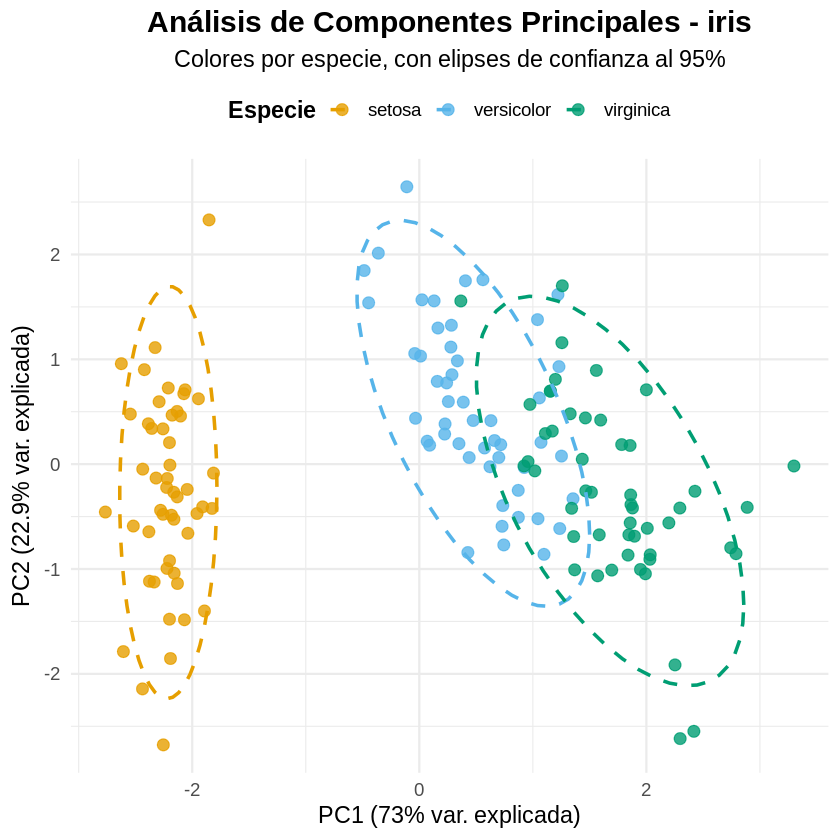

In [ ]:
install.packages("ggplot2")
install.packages("ggrepel")
install.packages("ggfortify")
install.packages("scales")
# Cargar paquetes necesarios
library(ggplot2)
library(ggrepel)
library(ggfortify)
library(scales)

# Usamos la base iris
data(iris)

# Realizamos el ACP sin incluir la columna 'Species'
pca <- prcomp(iris[, 1:4], center = TRUE, scale. = TRUE)

# Extraemos proporción de varianza explicada para usar en los ejes
pve <- summary(pca)$importance[2, 1:2] * 100

# Creamos el data frame con los scores del ACP y la especie
pca_df <- data.frame(pca$x, Species = iris$Species)

# Creamos el gráfico de ACP con ggplot2
ggplot(pca_df, aes(x = PC1, y = PC2, color = Species)) +
  geom_point(size = 3, alpha = 0.8) +
  stat_ellipse(level = 0.95, linetype = "dashed", size = 1) +
  scale_color_manual(values = c("#E69F00", "#56B4E9", "#009E73")) +
  labs(
    title = "Análisis de Componentes Principales - iris",
    subtitle = "Colores por especie, con elipses de confianza al 95%",
    x = paste0("PC1 (", round(pve[1], 1), "% var. explicada)"),
    y = paste0("PC2 (", round(pve[2], 1), "% var. explicada)"),
    color = "Especie"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.title = element_text(face = "bold", size = 18, hjust = 0.5),
    plot.subtitle = element_text(size = 14, hjust = 0.5),
    legend.position = "top",
    legend.title = element_text(face = "bold")
  )


# VECTOR DE MEDIAS

El **vector de medias** es una herramienta fundamental en estadística multivariada que resume la ubicación central de un conjunto de datos multidimensionales. Se construye calculando la media aritmética de cada variable, es decir, se obtiene un valor promedio por columna si los datos están organizados en forma matricial. Este vector no solo representa el centro de masa del conjunto de puntos, sino que también sirve como referencia para el análisis de dispersión y relaciones entre variables. En espacios bidimensionales o tridimensionales, puede visualizarse gráficamente como una flecha que va desde el origen hasta el punto que concentra las medias de las variables, proporcionando una interpretación geométrica clara y útil en contextos como el análisis de componentes principales, la clasificación o el análisis de conglomerados.


$$
\boldsymbol{\bar{x}} =
\begin{bmatrix}
\bar{x}_1 \\
\bar{x}_2 \\
\vdots \\
\bar{x}_p
\end{bmatrix}
$$
$$
\frac{1}{n} \sum_{i=1}^n
\begin{bmatrix}
x_{i1} \\
x_{i2} \\
\vdots \\
x_{ip}
\end{bmatrix}
$$


Warning message in geom_segment(aes(x = 0, y = 0, xend = media_vector["X"], yend = media_vector["Y"]), :
“All aesthetics have length 1, but the data has 10 rows.
ℹ Please consider using `annotate()` or provide this layer with data containing
  a single row.”
Warning message in geom_point(aes(x = media_vector["X"], y = media_vector["Y"]), :
“All aesthetics have length 1, but the data has 10 rows.
ℹ Please consider using `annotate()` or provide this layer with data containing
  a single row.”


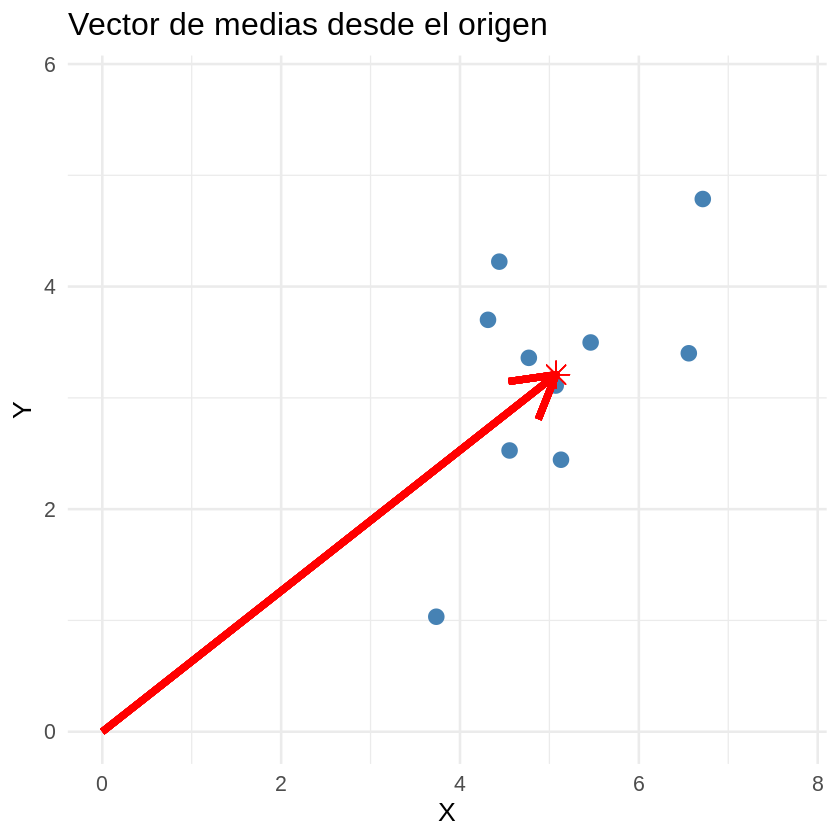

In [ ]:
# Vector de medias

# Cargar paquetes necesarios
library(ggplot2)
library(tibble)

# 1. Generamos datos simulados
set.seed(123)
datos <- tibble(
  X = rnorm(10, mean = 5),
  Y = rnorm(10, mean = 3),
  Z = rnorm(10, mean = 7)
)

# 2. Calculamos el vector de medias
media_vector <- colMeans(datos)

# 3. Dibujamos el vector de medias en 2D (usamos X vs Y)
ggplot(datos, aes(x = X, y = Y)) +
  geom_point(size = 4, color = "steelblue") +
  geom_segment(aes(x = 0, y = 0, xend = media_vector["X"], yend = media_vector["Y"]),
               arrow = arrow(length = unit(0.4, "inches")),
               color = "red", size = 2) +
  geom_point(aes(x = media_vector["X"], y = media_vector["Y"]),
             color = "red", size = 5, shape = 8) +
  labs(
    title = "Vector de medias desde el origen",
    x = "X", y = "Y"
  ) +
  theme_minimal(base_size = 16) +
  xlim(0, max(datos$X) + 1) +
  ylim(0, max(datos$Y) + 1)


# Diagrama de Caja.





Los **boxplots** (diagramas de caja y bigotes) son gráficos estadísticos utilizados para visualizar la distribución de una variable numérica y detectar valores atípicos. Este tipo de gráfico resume cinco estadísticas clave: el mínimo, el primer cuartil (Q1), la mediana (Q2), el tercer cuartil (Q3) y el máximo, y se representa mediante una caja (del Q1 al Q3), una línea en el interior (la mediana) y dos "bigotes" que se extienden hasta los valores extremos no considerados atípicos.

Una de las ventajas principales del boxplot es su capacidad para mostrar rápidamente la **asimetría** y **dispersión** de los datos, lo cual es fundamental para el análisis exploratorio. Además, los puntos individuales que quedan fuera del rango de los bigotes son considerados posibles **outliers** (valores atípicos), lo que permite detectar observaciones inusuales o errores de medición.

Cuando se agrupan los boxplots por categorías, como por ejemplo por especie en la base de datos `iris`, se facilita la **comparación visual entre grupos**. Esto permite identificar diferencias en medianas, variabilidad y presencia de outliers entre distintas poblaciones o tratamientos, haciendo del boxplot una herramienta poderosa en estudios comparativos.

En entornos modernos como R, los boxplots pueden enriquecerse visualmente usando librerías como `ggplot2` para crear gráficos elegantes y personalizables, y `plotly` para añadir interactividad. Esto no solo mejora la presentación, sino también la exploración dinámica de los datos, lo cual es especialmente útil en contextos académicos, científicos y profesionales.



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




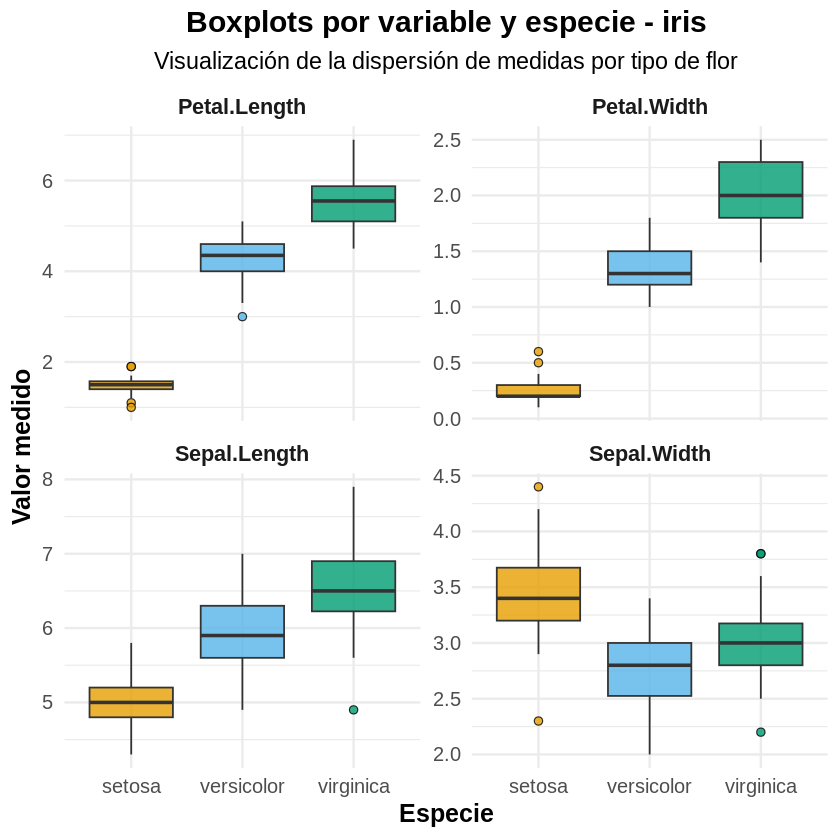

In [ ]:
# Cargar librerías necesarias
library(ggplot2)
library(tidyr)
library(dplyr)

# Transformamos la base iris a formato largo (long format)
iris_long <- iris %>%
  pivot_longer(cols = -Species, names_to = "Variable", values_to = "Valor")

# Creamos los boxplots hermosos
ggplot(iris_long, aes(x = Species, y = Valor, fill = Species)) +
  geom_boxplot(alpha = 0.8, outlier.color = "black", outlier.shape = 21, outlier.size = 2) +
  facet_wrap(~ Variable, scales = "free_y") +
  scale_fill_manual(values = c("#E69F00", "#56B4E9", "#009E73")) +
  labs(
    title = "Boxplots por variable y especie - iris",
    subtitle = "Visualización de la dispersión de medidas por tipo de flor",
    x = "Especie", y = "Valor medido", fill = "Especie"
  ) +
  theme_minimal(base_size = 15) +
  theme(
    plot.title = element_text(size = 18, face = "bold", hjust = 0.5),
    plot.subtitle = element_text(size = 14, hjust = 0.5),
    strip.text = element_text(face = "bold", size = 13),
    axis.title = element_text(face = "bold"),
    legend.position = "none"
  )


# Plotly



In [ ]:
# Instalar plotly si no está instalado (ejecutar solo una vez)
install.packages("plotly")

# Cargar la librería
library(plotly)

# Datos simples: boxplot de Sepal.Length por Species (iris)
plot_ly(
  data = iris,
  x = ~Species,
  y = ~Sepal.Length,
  type = "box",
  boxpoints = "all",    # Mostrar puntos individuales
  jitter = 0.3,         # Jitter para dispersar puntos
  pointpos = -1.8,      # Posición de puntos
  marker = list(color = 'rgb(7,40,89)'),
  line = list(color = 'rgb(7,40,89)')
) %>%
  layout(
    title = "Boxplot Interactivo Sepal.Length por Species",
    yaxis = list(title = "Sepal Length"),
    xaxis = list(title = "Species")
  )



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



HTML widgets cannot be represented in plain text (need html)

# MATRIZ DE VARIANZAS Y COVARIANZAS

La matriz de varianzas y covarianzas es una herramienta fundamental en estadística multivariada que resume la variabilidad y las relaciones lineales entre varias variables numéricas de un conjunto de datos. Cada elemento de esta matriz representa la covarianza entre dos variables, mientras que los elementos en la diagonal corresponden a las varianzas individuales de cada variable. Esto permite conocer no solo cuánto varía cada variable por sí misma, sino también cómo varían conjuntamente con otras variables.

La varianza mide la dispersión de una variable alrededor de su media, mientras que la covarianza indica la dirección y fuerza de la relación lineal entre dos variables. Si la covarianza es positiva, ambas variables tienden a aumentar o disminuir juntas; si es negativa, una variable tiende a aumentar cuando la otra disminuye. Una covarianza cercana a cero indica que no hay una relación lineal fuerte entre las variables.

Esta matriz es simétrica, es decir, la covarianza entre la variable A y la variable B es igual a la covarianza entre B y A. Además, es fundamental para diversos análisis estadísticos y de machine learning, como el Análisis de Componentes Principales (ACP), análisis factorial, y en la estimación de modelos multivariados, ya que provee información esencial sobre la estructura interna de los datos.

Finalmente, la matriz de varianzas y covarianzas es especialmente útil cuando se trabaja con datos multivariados porque permite entender las interdependencias entre variables y preparar la información para técnicas de reducción de dimensionalidad o clasificación. Su correcta interpretación facilita la identificación de patrones, relaciones y posibles redundancias en los datos.

In [ ]:
# Usamos solo las variables numéricas de iris
datos_numericos <- iris[, 1:4]

# Matriz de varianzas y covarianzas
matriz_covarianza <- cov(datos_numericos)

# Mostrar la matriz
print(matriz_covarianza)


             Sepal.Length Sepal.Width Petal.Length Petal.Width
Sepal.Length    0.6856935  -0.0424340    1.2743154   0.5162707
Sepal.Width    -0.0424340   0.1899794   -0.3296564  -0.1216394
Petal.Length    1.2743154  -0.3296564    3.1162779   1.2956094
Petal.Width     0.5162707  -0.1216394    1.2956094   0.5810063


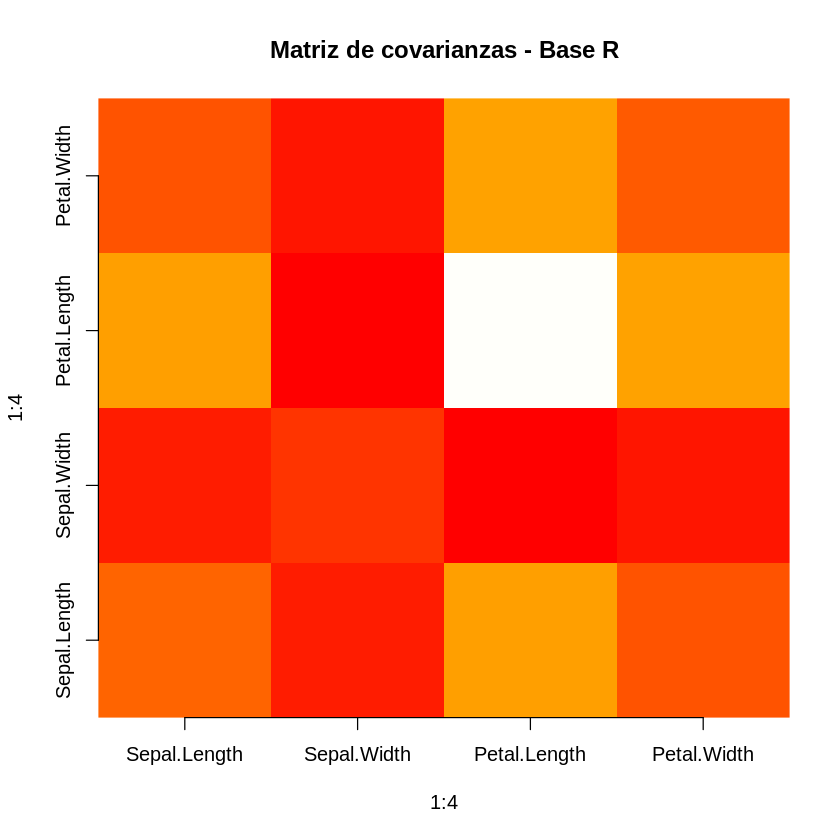

In [ ]:
datos <- iris[, 1:4]
cov_mat <- cov(datos)

# Visualización básica tipo mapa de calor
image(1:4, 1:4, cov_mat,
      axes = FALSE,
      col = heat.colors(100),
      main = "Matriz de covarianzas - Base R")

axis(1, at = 1:4, labels = colnames(cov_mat))
axis(2, at = 1:4, labels = colnames(cov_mat))


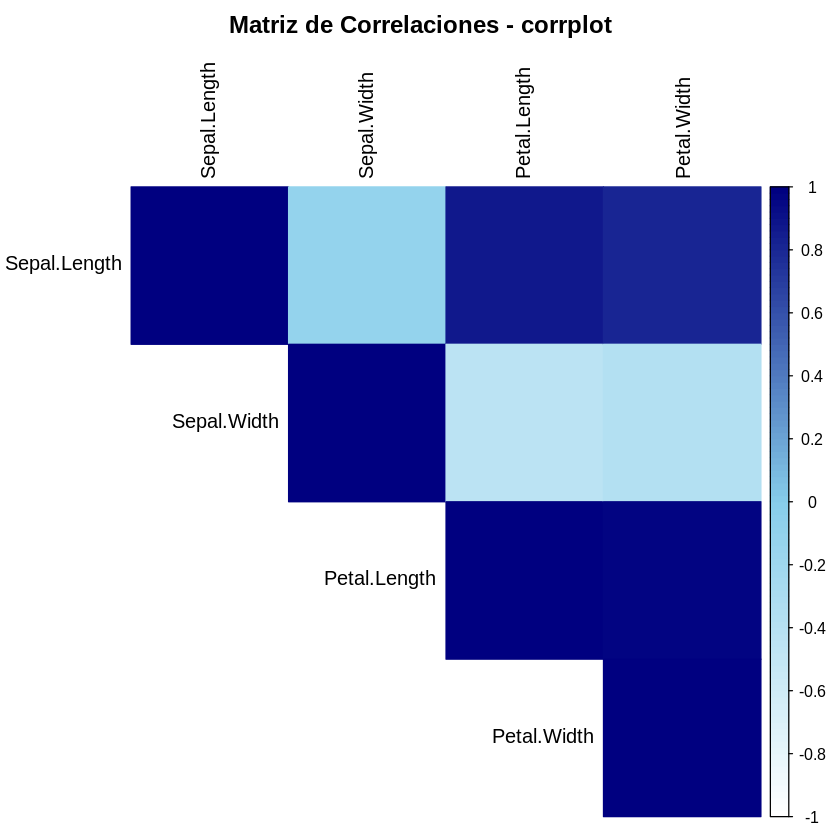

In [ ]:
library(corrplot)

datos <- iris[, 1:4]
cor_mat <- cor(datos)  # Matriz de correlaciones

corrplot(cor_mat,
         method = "color",
         type = "upper",
         tl.col = "black",
         col = colorRampPalette(c("white", "skyblue", "navy"))(100),
         title = "Matriz de Correlaciones - corrplot",
         mar = c(0,0,2,0))



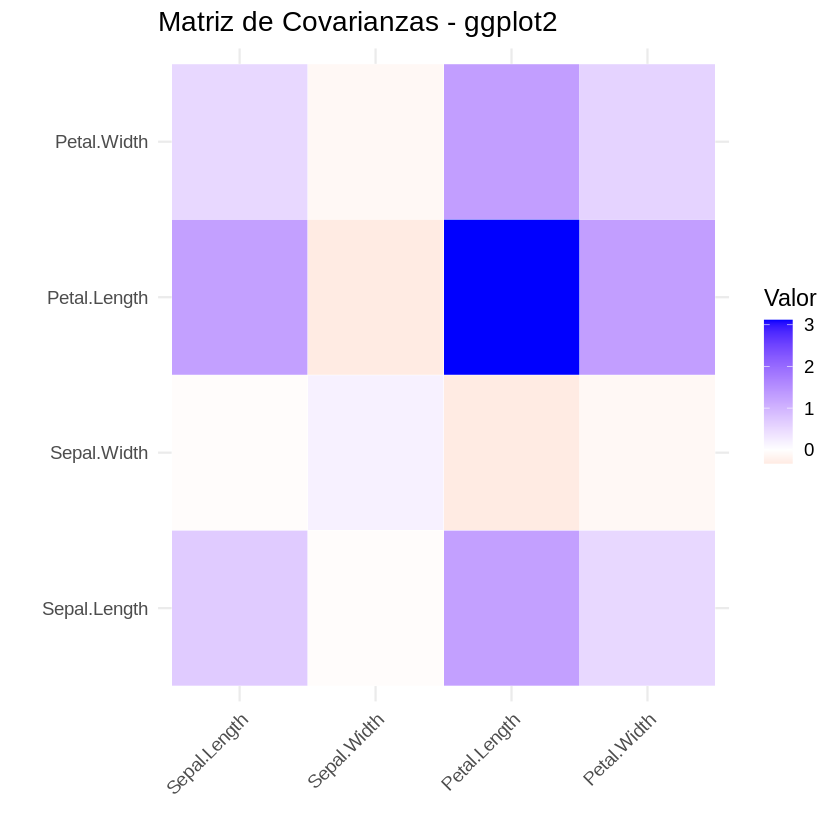

In [ ]:
library(tibble)
library(ggplot2)

# Convertir matriz a formato largo
cov_long <- as.data.frame(as.table(cov_mat))

# Graficar
ggplot(cov_long, aes(Var1, Var2, fill = Freq)) +
  geom_tile(color = "white") +
  scale_fill_gradient2(low = "red", mid = "white", high = "blue", midpoint = 0) +
  labs(title = "Matriz de Covarianzas - ggplot2",
       x = "", y = "", fill = "Valor") +
  theme_minimal(base_size = 14) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))


# Matriz de correlación

Tanto en las ciencias exactas como en las ciencias humanas el análisis de la correlación entre variables
ayuda a evaluar dependencias. Sin embargo, en algunos casos estas dependencias pueden ser no lineales y
no cumplir los supuestos básicos para hacer un análisis, por ese motivo es necesario explorar otro tipo de
coeficientes de correlación no lineal que permite flexibilizar el supuesto de normalidad bi-variante.
En (Martínez r., et al., 2009) se presenta una caracterización por rangos del coeficiente de correlación de
Spearman, el cual permite evaluar la relación entre variables de manera no lineal, pero con presencia de
monotonía, tanto creciente como decreciente. Por otro lado, (Bastías et al., 2013) destacan la importancia
de las Buenas Prácticas de Manufactura, señalando que, en áreas como la medicina, muchas variables,
aunque se representan numéricamente, no son necesariamente variables de razón. (Santabárbara, 2019)
Explica que en muchos estudios solo se presenta el valor estimado del coeficiente de variación. Sin
embargo, el autor argumenta que es una buena práctica registrar un intervalo de confianza que acompañe
la estimación puntual, ya que en muchos casos el coeficiente aparente puede estar muy alejado de cero.
No obstante, al calcular el intervalo, este puede incluir el cero o tener un límite inferior cercano a cero, lo
que indicaría que no existe una correlación significativamente alta. El autor también destaca la ventaja de
utilizar SPSS para calcular el coeficiente de correlación de manera precisa, y en este artículo se explora el
uso del programa R (https://www.R-project.org/).

En el trabajo de (Serna-Morales , J. K., etal.,2024) se expone que los datos de falla bivariados son
comunes en estudios de confiabilidad y supervivencia, donde la estimación de la fuerza de dependencia es
a menudo un paso importante en el análisis de los datos. En la literatura, se ha establecido que los
coeficientes de correlación miden la relación lineal entre dos variables, pero también pueden existir
relaciones no lineales fuertes entre ellas. El coeficiente de concordancia t de Kendall se ha convertido en
una herramienta útil para el análisis de datos bivariados, la cual es usada en pruebas no paramétricas de
independencia y como una medida complementaria de asociación. En el análisis de datos de
confiabilidad, hay un fenómeno que ocurre cuando el valor de las observaciones se conoce parcialmente,
lo cual se conoce como censura. En este trabajo, se comparan vía simulación dos métodos de estimación
del t de Kendall, una de ellas suponiendo normalidad en las distribuciones marginales y ajustándose
individualmente, y la otra basada en cópulas (Gaussiana y Clayton), donde los datos bivariados están
censurados a intervalo.
Otra alternativa que se expone en este artículo es el Bootstrap, cuyo fundamento teórico se detalla en la
literatura. En este caso, se aborda su aplicación en el contexto multivariante. Es importante señalar que las
muestras bootstrap univariantes para cada variable no son equivalentes a las muestras multivariantes
bootstrap, y de hecho, sería erróneo tratar de relacionarlas directamente.

In [ ]:
# Usar solo variables numéricas
datos <- iris[, 1:4]

# Calcular matriz de correlación
cor_mat <- cor(datos)

# Mostrar matriz en consola
print(cor_mat)


             Sepal.Length Sepal.Width Petal.Length Petal.Width
Sepal.Length    1.0000000  -0.1175698    0.8717538   0.8179411
Sepal.Width    -0.1175698   1.0000000   -0.4284401  -0.3661259
Petal.Length    0.8717538  -0.4284401    1.0000000   0.9628654
Petal.Width     0.8179411  -0.3661259    0.9628654   1.0000000


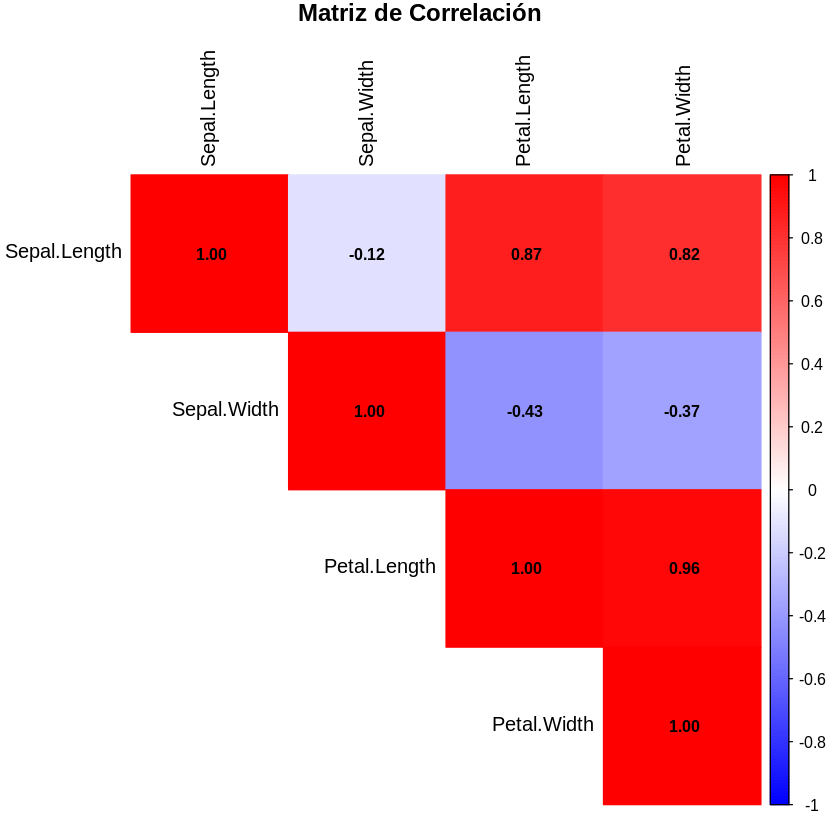

In [ ]:
# Instalar paquete si no lo tienes
# install.packages("corrplot")
library(corrplot)

# Graficar matriz de correlación
corrplot(cor_mat,
         method = "color",
         type = "upper",
         tl.col = "black",
         addCoef.col = "black",
         number.cex = 0.8,
         col = colorRampPalette(c("blue", "white", "red"))(200),
         title = "Matriz de Correlación",
         mar = c(0,0,1,0))


In [ ]:
# Instalar plotly si no está instalado
install.packages("plotly")

library(plotly)

# Datos numéricos iris
datos <- iris[, 1:4]

# Calcular matriz de correlación
cor_mat <- cor(datos)

# Crear mapa de calor interactivo con plotly
plot_ly(
  z = cor_mat,
  x = colnames(cor_mat),
  y = rownames(cor_mat),
  type = "heatmap",
  colorscale = "RdBu",
  reversescale = TRUE
) %>%
  layout(
    title = "Mapa de calor interactivo - Matriz de correlación",
    xaxis = list(ticks = "", side = "bottom"),
    yaxis = list(ticks = "", ticksuffix = "  ")
  )


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



HTML widgets cannot be represented in plain text (need html)

Antes de realizar cualquier análisis inferencial, es fundamental explorar los datos mediante gráficos. La visualización gráfica permite identificar patrones, tendencias, posibles valores atípicos y distribuciones de las variables, lo cual es esencial para comprender la estructura y características básicas del conjunto de datos. Sin esta etapa exploratoria, es fácil pasar por alto aspectos importantes que pueden afectar la validez de los resultados inferenciales.

Los gráficos también ayudan a detectar violaciones a los supuestos estadísticos, como la normalidad, homocedasticidad o independencia, que muchas pruebas inferenciales requieren. Por ejemplo, un histograma o un diagrama de caja pueden mostrar si una variable sigue una distribución aproximada a la normal, mientras que un gráfico de dispersión puede revelar relaciones lineales o no lineales entre variables. Identificar estas condiciones mediante la visualización contribuye a elegir el método estadístico más adecuado.

Al hacer gráficos antes de la inferencia, se mejora la comunicación y comprensión de los datos tanto para el analista como para otros interesados. Visualizar los datos de forma clara y efectiva facilita la interpretación y la toma de decisiones informadas.

# EJEMPLO
En un diseño de experimento, el objetivo principal es estudiar el efecto de una o más variables independientes (factores) sobre una variable dependiente, controlando o eliminando el impacto de otras variables no deseadas. Por ejemplo, en un experimento agrícola se puede analizar cómo diferentes tipos de fertilizantes afectan el crecimiento de una planta. Para ello, se asignan aleatoriamente tratamientos a diferentes grupos y se recopilan datos sobre la respuesta (por ejemplo, altura de la planta).

Los boxplots son herramientas gráficas muy útiles en este contexto porque permiten visualizar la distribución de la variable respuesta para cada nivel del factor o tratamiento. A través de ellos se pueden observar diferencias en medianas, rangos intercuartílicos y presencia de valores atípicos entre grupos experimentales. Esto ayuda a detectar efectos potenciales de los tratamientos antes de realizar análisis estadísticos más formales, como un análisis de varianza (ANOVA).

Además, los boxplots facilitan la comunicación visual de los resultados del experimento a distintos públicos, desde investigadores hasta tomadores de decisiones. Permiten comparar rápidamente los efectos de los factores y evaluar la variabilidad dentro y entre grupos. Los boxplots constituyen una herramienta esencial para explorar y presentar datos en el análisis de diseños experimentales.

## Análisis visual con los Boxplots

El objetivo principal es estudiar el efecto de una o más variables independientes (factores) sobre una variable dependiente, controlando o eliminando el impacto de otras variables no deseadas. Por ejemplo, en un experimento agrícola se puede analizar cómo diferentes tipos de fertilizantes afectan el crecimiento de una planta. Para ello, se asignan aleatoriamente tratamientos a diferentes grupos y se recopilan datos sobre la respuesta (por ejemplo, altura de la planta).

Los boxplots son herramientas gráficas muy útiles en este contexto porque permiten visualizar la distribución de la variable respuesta para cada nivel del factor o tratamiento. A través de ellos se pueden observar diferencias en medianas, rangos intercuartílicos y presencia de valores atípicos entre grupos experimentales. Esto ayuda a detectar efectos potenciales de los tratamientos antes de realizar análisis estadísticos más formales, como un análisis de varianza (ANOVA).

Además, los boxplots facilitan la comunicación visual de los resultados del experimento a distintos públicos, desde investigadores hasta tomadores de decisiones. Permiten comparar rápidamente los efectos de los factores y evaluar la variabilidad dentro y entre grupos. En resumen, los boxplots constituyen una herramienta esencial para explorar y presentar datos en el análisis de diseños experimentales.

---

## Datos observados para el problema

| Icopor | Biopak | Cry-0-Vac | Shopak |
|--------|--------|-----------|--------|
| 5.33   | 6.59   | 4.95      | 2.41   |
| 4.95   | 7.90   | 4.44      | 2.83   |
| 5.10   | 4.48   | 3.48      | 2.93   |
| 7.14   | 7.32   | 3.92      | 2.38   |
| 7.84   | 6.41   | 8.62      | 2.11   |


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message:
“The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”


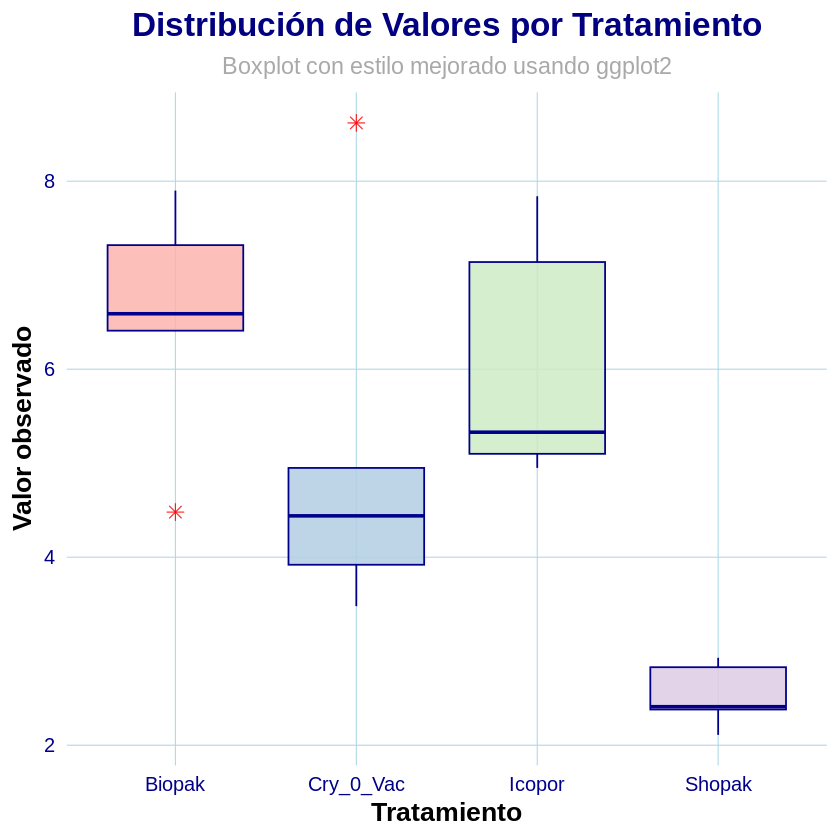

In [ ]:
install.packages("ggthemes")
library(tidyverse)
library(ggthemes)  # Para temas elegantes

# Datos
datos <- data.frame(
  Icopor = c(5.33, 4.95, 5.10, 7.14, 7.84),
  Biopak = c(6.59, 7.90, 4.48, 7.32, 6.41),
  Cry_0_Vac = c(4.95, 4.44, 3.48, 3.92, 8.62),
  Shopak = c(2.41, 2.83, 2.93, 2.38, 2.11)
)

datos_long <- datos %>%
  pivot_longer(cols = everything(), names_to = "Tratamiento", values_to = "Valor")

# Boxplot mejorado
ggplot(datos_long, aes(x = Tratamiento, y = Valor, fill = Tratamiento)) +
  geom_boxplot(alpha = 0.85, color = "darkblue", outlier.color = "red", outlier.shape = 8, outlier.size = 3) +
  scale_fill_brewer(palette = "Pastel1") +
  labs(
    title = "Distribución de Valores por Tratamiento",
    subtitle = "Boxplot con estilo mejorado usando ggplot2",
    x = "Tratamiento",
    y = "Valor observado"
  ) +
  theme_minimal(base_size = 16) +
  theme(
    plot.title = element_text(face = "bold", size = 20, hjust = 0.5, color = "navy"),
    plot.subtitle = element_text(size = 14, hjust = 0.5, color = "darkgrey"),
    axis.title = element_text(face = "bold"),
    axis.text = element_text(color = "darkblue", size = 12),
    legend.position = "none",
    panel.grid.major = element_line(color = "lightblue", size = 0.3),
    panel.grid.minor = element_blank()
  )


In [ ]:

# Cargar librerías necesarias
install.packages("DescTools")
install.packages("multcomp")
library(tidyverse)
library(DescTools)  # Para la prueba de Newman-Keuls
library(multcomp)   # Para comparaciones múltiples con t-student ajustado

# Datos (mismo data frame largo que antes)
datos <- data.frame(
  Icopor = c(5.33, 4.95, 5.10, 7.14, 7.84),
  Biopak = c(6.59, 7.90, 4.48, 7.32, 6.41),
  Cry_0_Vac = c(4.95, 4.44, 3.48, 3.92, 8.62),
  Shopak = c(2.41, 2.83, 2.93, 2.38, 2.11)
)

datos_long <- datos %>%
  pivot_longer(cols = everything(), names_to = "Tratamiento", values_to = "Valor")

# Ajustar ANOVA
anova_res <- aov(Valor ~ Tratamiento, data = datos_long)

# a) Prueba de intervalos múltiples Newman-Keuls
nk_res <- PosthocTest(anova_res, method = "newman-keuls")
print("Resultados Newman-Keuls:")
print(nk_res$Tratamiento)

# Interpretación (ejemplo de cómo comentar)
# El procedimiento Newman-Keuls ajusta para comparaciones múltiples entre pares de tratamientos.
# Se observa qué pares presentan diferencias significativas en sus medias.

# b) Prueba t-Student para pares de grupos (sin ajuste)
pairwise_t <- pairwise.t.test(datos_long$Valor, datos_long$Tratamiento, p.adjust.method = "none")
print("Resultados pares t-Student sin ajuste:")
print(pairwise_t)

# Prueba t-Student con ajuste Bonferroni para comparación múltiple
pairwise_t_adj <- pairwise.t.test(datos_long$Valor, datos_long$Tratamiento, p.adjust.method = "bonferroni")
print("Resultados pares t-Student con ajuste Bonferroni:")
print(pairwise_t_adj)


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘zoo’, ‘TH.data’, ‘sandwich’


Loading required package: mvtnorm

Loading required package: survival

Loading required package: TH.data

Loading required package: MASS


Attaching package: ‘MASS’


The following object is masked from ‘package:plotly’:

    select


The following object is masked from ‘package:dplyr’:

    select



Attaching package: ‘TH.data’


The following object is masked from ‘package:MASS’:

    geyser




ERROR: Error in PosthocTest(anova_res, method = "newman-keuls"): could not find function "PosthocTest"


# HISTOGRAMA

El histograma es una herramienta gráfica fundamental en el análisis de datos que permite visualizar la distribución de una variable numérica. Consiste en dividir el rango de los datos en intervalos consecutivos, llamados "clases" o "bins", y representar mediante barras la frecuencia o cantidad de datos que caen dentro de cada intervalo. De esta forma, el histograma ofrece una imagen clara y sencilla de cómo se distribuyen los datos, facilitando la identificación de patrones, tendencias y posibles anomalías.

A diferencia de un gráfico de barras convencional, donde cada barra representa una categoría diferente, en el histograma las barras están agrupadas contiguamente porque representan intervalos continuos de valores. Esto ayuda a mostrar la densidad de los datos en distintas regiones y a entender si la distribución es simétrica, sesgada o si presenta varios picos. Además, el área total bajo las barras es proporcional al total de observaciones, lo que permite comparar fácilmente diferentes grupos o muestras.

El histograma es especialmente útil como paso preliminar en el análisis estadístico, pues ayuda a detectar características importantes como la normalidad, la presencia de valores atípicos o la dispersión. También es una herramienta valiosa para decidir qué métodos estadísticos aplicar, ya que ciertos análisis requieren supuestos sobre la forma de la distribución de los datos. En resumen, el histograma es un método gráfico que ofrece una visión general rápida y efectiva de la estructura interna de un conjunto de datos.

Su simplicidad y claridad lo hacen accesible para personas sin experiencia avanzada en estadística, siendo ampliamente utilizado en campos diversos como la ciencia, la ingeniería, la economía y la medicina. Además, es la base para otros tipos de gráficos y análisis más complejos, como los diagramas de densidad o los análisis de frecuencias acumuladas, consolidándose como una herramienta esencial en la exploración y comunicación de datos.

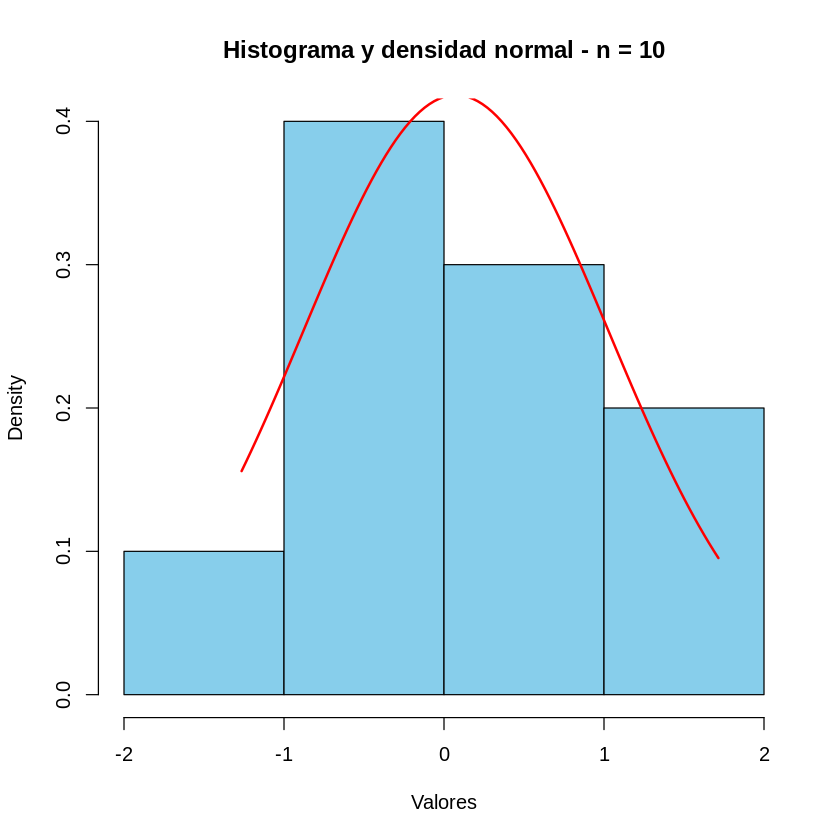

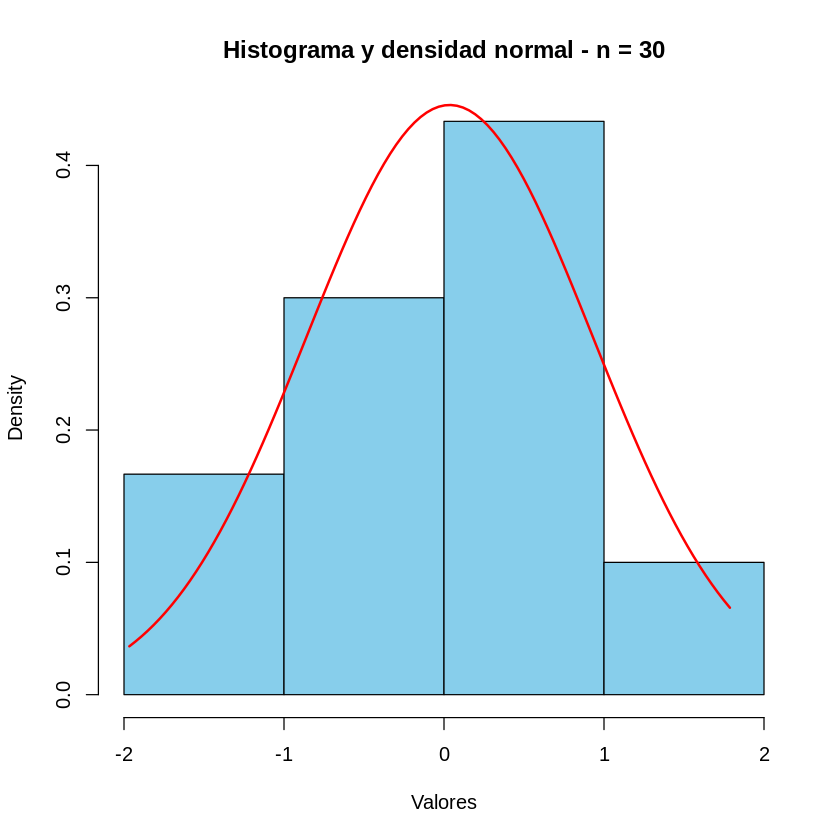

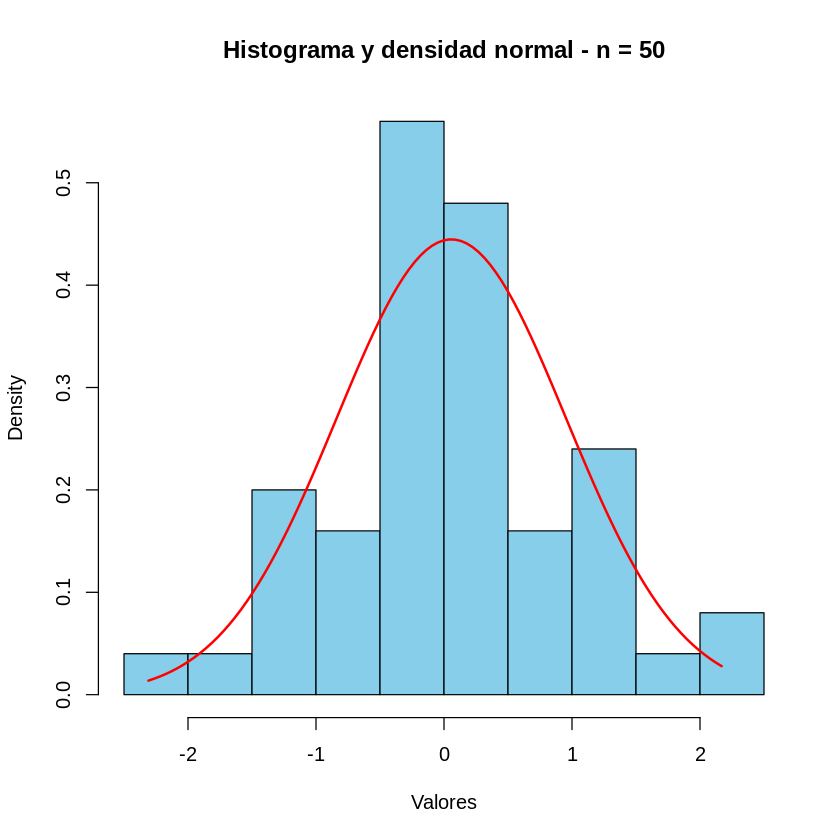

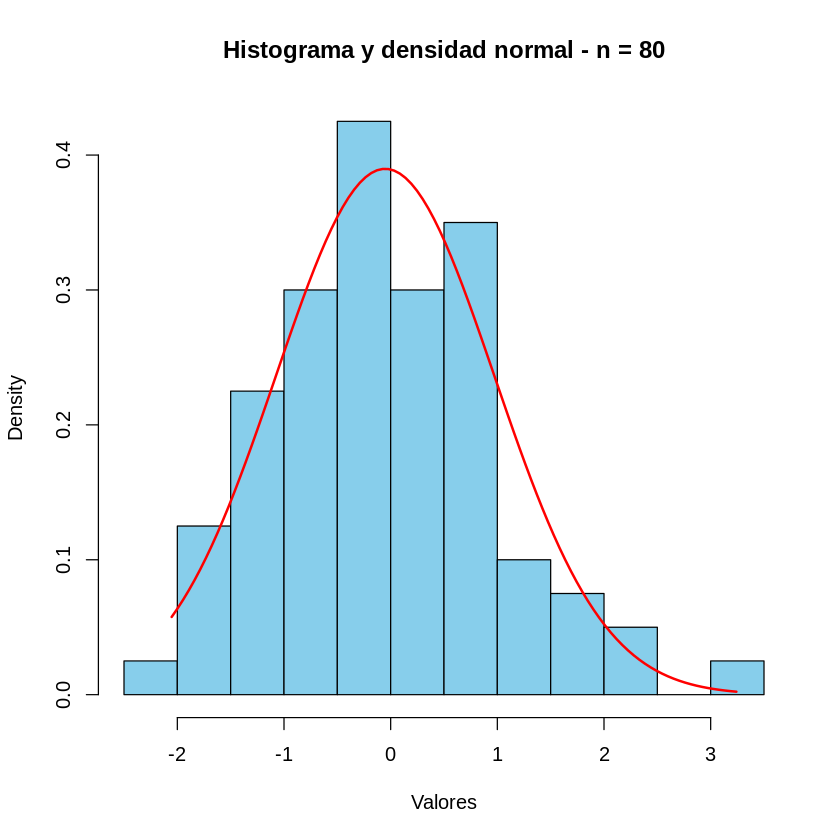

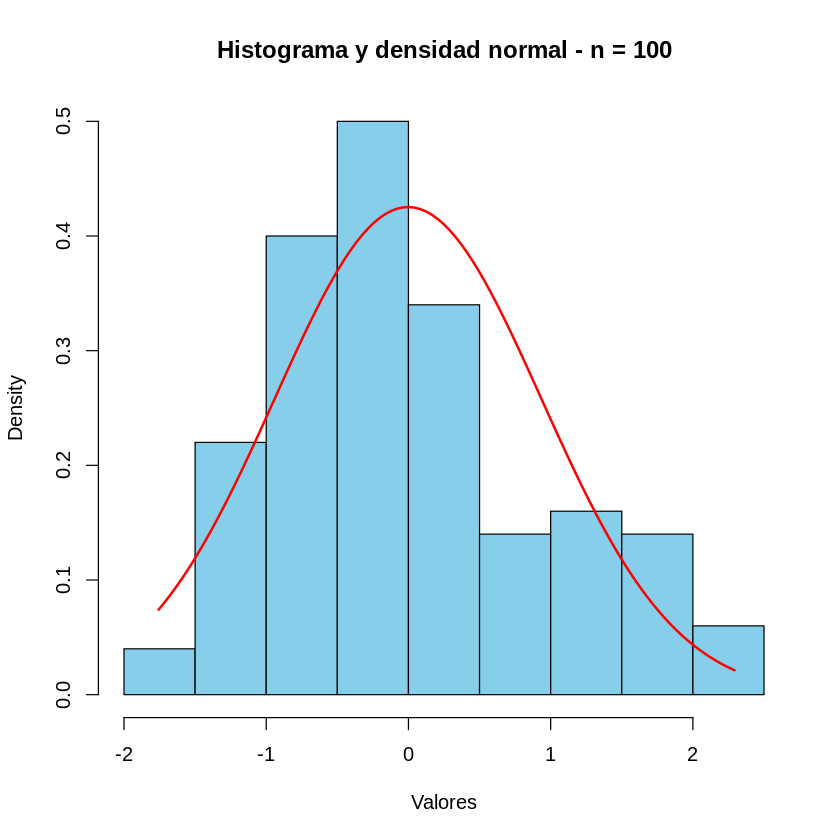

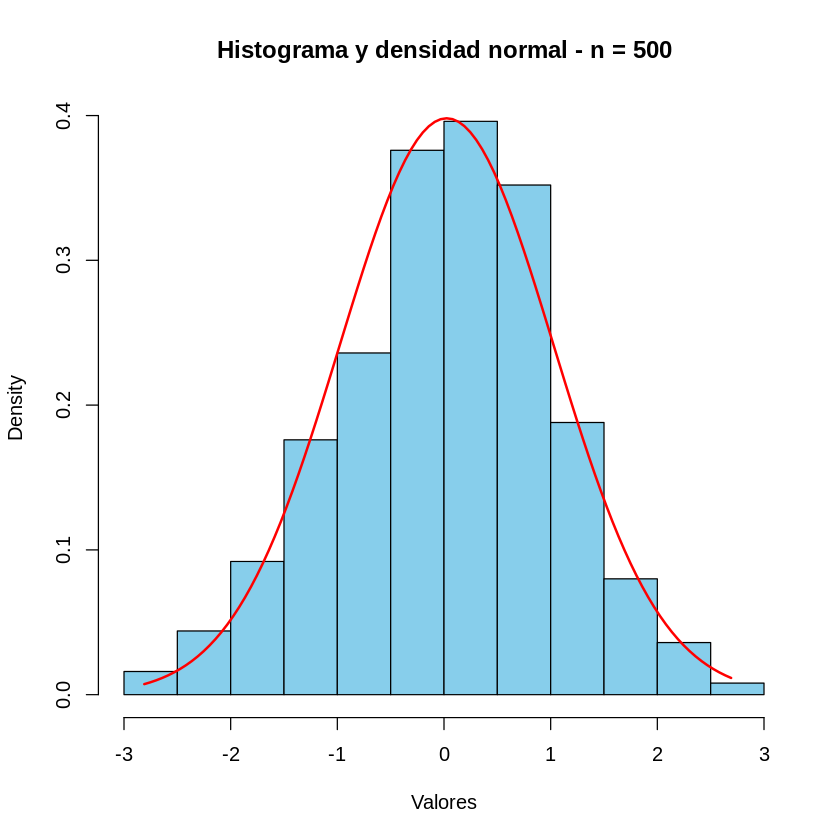

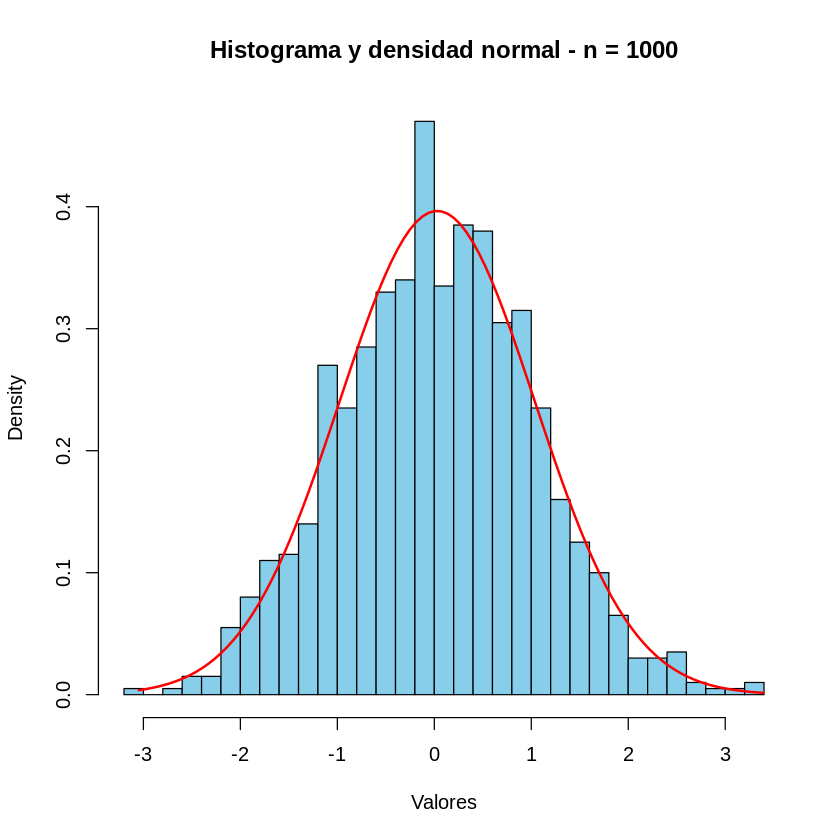

In [ ]:
# Tamaños de muestra
n_values <- c(10, 30, 50, 80, 100, 500, 1000)

# Semilla para reproducibilidad
set.seed(123)

for (n in n_values) {
  # Generar muestra normal
  x <- rnorm(n, mean = 0, sd = 1)

  # Crear histograma normalizado (densidad)
  hist(x, breaks = "FD", freq = FALSE,
       main = paste("Histograma y densidad normal - n =", n),
       xlab = "Valores", col = "skyblue", border = "black")

  # Secuencia para densidad
  xseq <- seq(min(x), max(x), length.out = 100)

  # Densidad normal teórica
  yseq <- dnorm(xseq, mean = mean(x), sd = sd(x))

  # Agregar curva de densidad
  lines(xseq, yseq, col = "red", lwd = 2)
}


El análisis descriptivo es el primer paso para entender cualquier conjunto de datos. En el caso de la base cars, que contiene las variables velocidad (speed) y distancia de frenado (dist), es importante conocer las medidas de tendencia central, dispersión y la estructura general de los datos. Esto ayuda a obtener una idea clara sobre cómo se comportan las variables y si hay valores atípicos o patrones evidentes.

Las estadísticas como la media, mediana, desviación estándar y rango resumen rápidamente las características de las variables. Además, un resumen rápido permite ver la cantidad de observaciones y detectar posibles inconsistencias o errores en la base, preparando el terreno para análisis más avanzados.

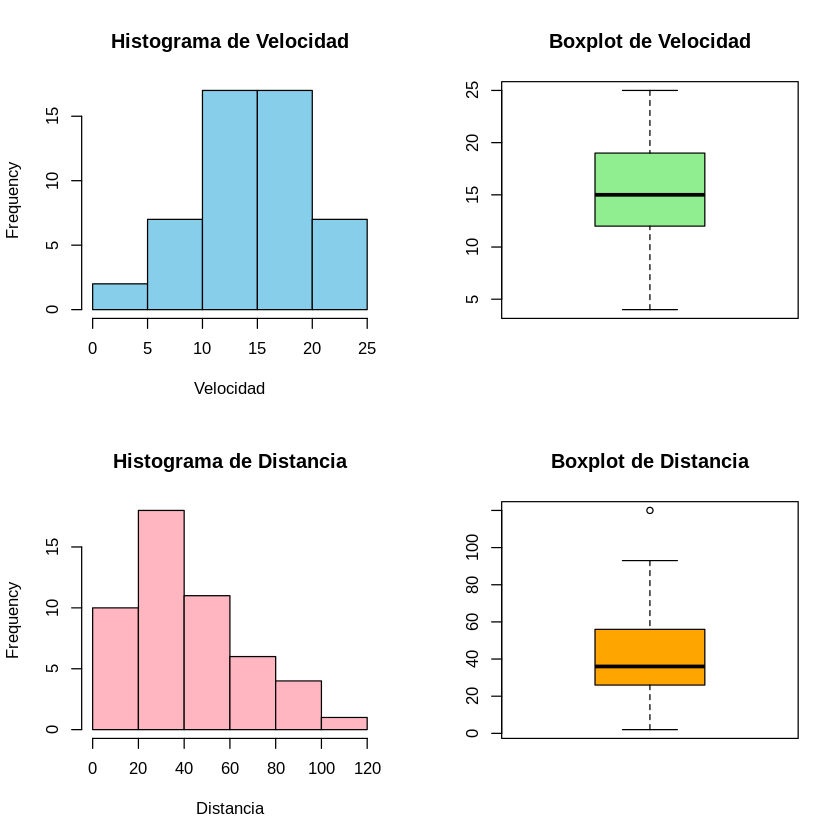

In [ ]:
data(cars)
# Histogramas y boxplots
par(mfrow = c(2, 2))
hist(cars$speed, main = "Histograma de Velocidad", xlab = "Velocidad", col = "skyblue")
boxplot(cars$speed, main = "Boxplot de Velocidad", col = "lightgreen")
hist(cars$dist, main = "Histograma de Distancia", xlab = "Distancia", col = "lightpink")
boxplot(cars$dist, main = "Boxplot de Distancia", col = "orange")


La correlación mide la relación lineal entre dos variables. En el dataset cars, la relación entre la velocidad y la distancia de frenado es fundamental para entender cómo influye la velocidad en la distancia necesaria para detener el vehículo. Calcular el coeficiente de correlación de Pearson ayuda a cuantificar esta asociación.

Un coeficiente cercano a 1 o -1 indica una relación fuerte positiva o negativa, respectivamente, mientras que valores cercanos a 0 sugieren poca o ninguna correlación lineal. Visualizar esta relación con un scatterplot también permite identificar si la relación es lineal o si existen patrones más complejos.




Coeficiente de correlación entre velocidad y distancia: 0.8068949 


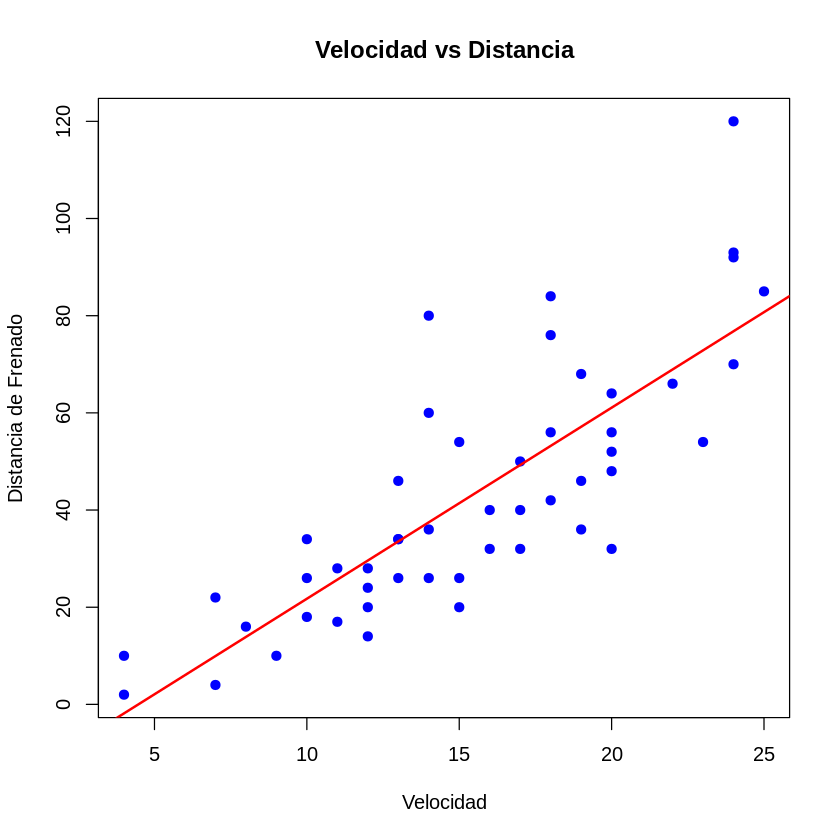

In [ ]:
# Correlación y scatterplot
correlation <- cor(cars$speed, cars$dist)
cat("Coeficiente de correlación entre velocidad y distancia:", correlation, "\n")

plot(cars$speed, cars$dist, main = "Velocidad vs Distancia",
     xlab = "Velocidad", ylab = "Distancia de Frenado",
     pch = 19, col = "blue")
abline(lm(dist ~ speed, data = cars), col = "red", lwd = 2)


La regresión lineal simple modela la relación entre una variable dependiente y una independiente. En este caso, se puede modelar la distancia de frenado como función de la velocidad. Este análisis permite predecir la distancia a partir de una velocidad dada y entender qué tan bien la velocidad explica la variabilidad en la distancia.

Los coeficientes del modelo muestran el intercepto y la pendiente, indicando el punto de inicio y el cambio esperado en la distancia por cada unidad adicional de velocidad. Evaluar los residuos del modelo ayuda a comprobar la adecuación y posibles desviaciones del supuesto lineal.


Call:
lm(formula = dist ~ speed, data = cars)

Residuals:
    Min      1Q  Median      3Q     Max 
-29.069  -9.525  -2.272   9.215  43.201 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -17.5791     6.7584  -2.601   0.0123 *  
speed         3.9324     0.4155   9.464 1.49e-12 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 15.38 on 48 degrees of freedom
Multiple R-squared:  0.6511,	Adjusted R-squared:  0.6438 
F-statistic: 89.57 on 1 and 48 DF,  p-value: 1.49e-12


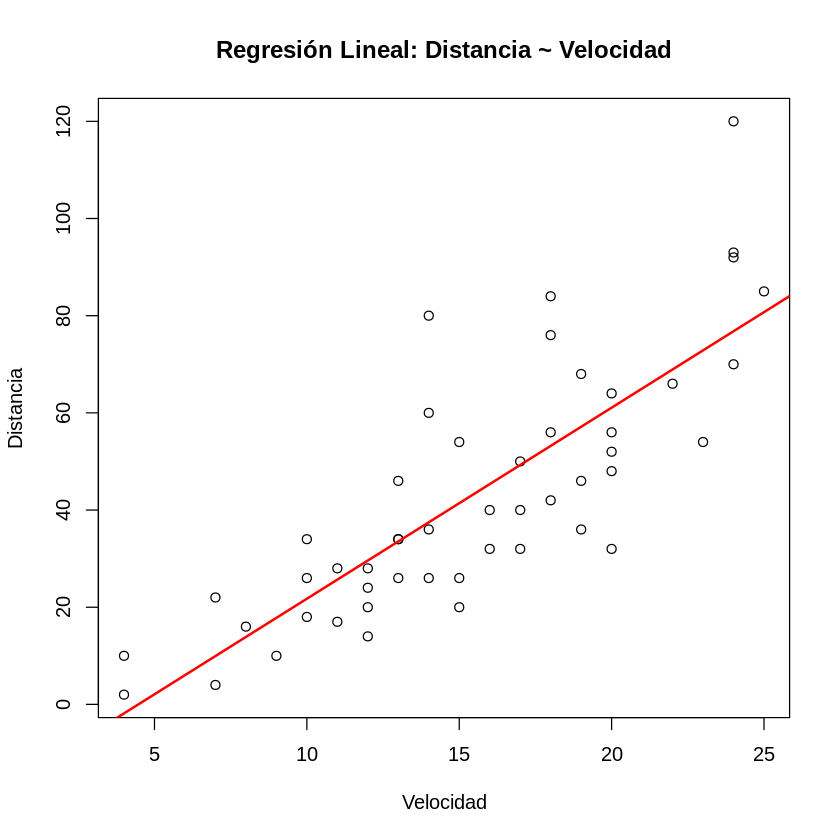

In [ ]:
# Modelo de regresión lineal
modelo <- lm(dist ~ speed, data = cars)
summary(modelo)

plot(cars$speed, cars$dist, main = "Regresión Lineal: Distancia ~ Velocidad",
     xlab = "Velocidad", ylab = "Distancia")
abline(modelo, col = "red", lwd = 2)


In [ ]:
# Instalar y cargar librerías
if (!require(ggplot2)) install.packages("ggplot2")
if (!require(plotly)) install.packages("plotly")

library(ggplot2)
library(plotly)

# Base cars
data("cars")

# Gráfico con ggplot2
p <- ggplot(cars, aes(x = speed, y = dist, text = paste("Velocidad:", speed, "<br>Distancia:", dist))) +
  geom_point(color = "#2c3e50", size = 4, alpha = 0.8, shape = 21, fill = "#3498db", stroke = 1.2) + # puntos azules con borde oscuro
  geom_smooth(method = "lm", se = TRUE, color = "#e74c3c", size = 1.5, fill = "#f1948a") + # línea y sombra de regresión
  labs(title = "Relación entre Velocidad y Distancia de Frenado",
       subtitle = "Base de datos cars con línea de regresión y visualización interactiva",
       x = "Velocidad (mph)",
       y = "Distancia de frenado (ft)") +
  theme_minimal(base_size = 15) +
  theme(plot.title = element_text(face = "bold", size = 20, hjust = 0.5),
        plot.subtitle = element_text(size = 14, hjust = 0.5),
        panel.grid.major = element_line(color = "grey80"),
        panel.grid.minor = element_blank())

# Convertir a gráfico interactivo con plotly
ggplotly(p, tooltip = "text")


`geom_smooth()` using formula = 'y ~ x'


HTML widgets cannot be represented in plain text (need html)